# Imports

In [1]:
# Data Analysis
import numpy as np
import pandas as pd

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Preprocessing
from sklearn.preprocessing import StandardScaler
from scipy import stats

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')

# Options

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.expand_frame_repr', True)

sns.set_palette('Set1')
sns.set_style("white")

# Acquiring Data

In [3]:
train_df = pd.read_csv('../input/house-prices-advanced-regression-techniques/train.csv')
test_df = pd.read_csv('../input/house-prices-advanced-regression-techniques/test.csv')

# Analysis

In [4]:
print(train_df.columns.values)

['Id' 'MSSubClass' 'MSZoning' 'LotFrontage' 'LotArea' 'Street' 'Alley'
 'LotShape' 'LandContour' 'Utilities' 'LotConfig' 'LandSlope'
 'Neighborhood' 'Condition1' 'Condition2' 'BldgType' 'HouseStyle'
 'OverallQual' 'OverallCond' 'YearBuilt' 'YearRemodAdd' 'RoofStyle'
 'RoofMatl' 'Exterior1st' 'Exterior2nd' 'MasVnrType' 'MasVnrArea'
 'ExterQual' 'ExterCond' 'Foundation' 'BsmtQual' 'BsmtCond' 'BsmtExposure'
 'BsmtFinType1' 'BsmtFinSF1' 'BsmtFinType2' 'BsmtFinSF2' 'BsmtUnfSF'
 'TotalBsmtSF' 'Heating' 'HeatingQC' 'CentralAir' 'Electrical' '1stFlrSF'
 '2ndFlrSF' 'LowQualFinSF' 'GrLivArea' 'BsmtFullBath' 'BsmtHalfBath'
 'FullBath' 'HalfBath' 'BedroomAbvGr' 'KitchenAbvGr' 'KitchenQual'
 'TotRmsAbvGrd' 'Functional' 'Fireplaces' 'FireplaceQu' 'GarageType'
 'GarageYrBlt' 'GarageFinish' 'GarageCars' 'GarageArea' 'GarageQual'
 'GarageCond' 'PavedDrive' 'WoodDeckSF' 'OpenPorchSF' 'EnclosedPorch'
 '3SsnPorch' 'ScreenPorch' 'PoolArea' 'PoolQC' 'Fence' 'MiscFeature'
 'MiscVal' 'MoSold' 'YrSold' 'SaleTy

In [5]:
print('train shape: {}'.format(train_df.shape) + '\n' + 'test shape: {}'.format(test_df.shape))

train shape: (1460, 81)
test shape: (1459, 80)


In [6]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [7]:
print('Training dataset has {} duplicated records'.format(train_df.duplicated().sum()))
print('Test dataset has {} duplicated records'.format(test_df.duplicated().sum()))

Training dataset has 0 duplicated records
Test dataset has 0 duplicated records


In [8]:
def null_report(df):
    result = pd.concat([df.isna().sum(), round(df.isna().sum() * 100 / df.shape[0], 2)], axis=1)
    result.columns = ['Quantity', 'Percentage']
    result.drop(result[result['Quantity'] == 0].index, inplace=True)
    return result

In [9]:
null_train = null_report(train_df)
null_test = null_report(test_df)

null_train.join(null_test, how='outer', lsuffix='_train', rsuffix='_test').sort_values(by='Percentage_train', ascending=False)

,Quantity_train,Percentage_train,Quantity_test,Percentage_test
PoolQC,1453.0,99.52,1456.0,99.79
MiscFeature,1406.0,96.30,1408.0,96.50
Alley,1369.0,93.77,1352.0,92.67
Fence,1179.0,80.75,1169.0,80.12
FireplaceQu,690.0,47.26,730.0,50.03
LotFrontage,259.0,17.74,227.0,15.56
GarageFinish,81.0,5.55,78.0,5.35
GarageQual,81.0,5.55,78.0,5.35
GarageType,81.0,5.55,76.0,5.21
GarageYrBlt,81.0,5.55,78.0,5.35


In [10]:
for df in [train_df, test_df]:
    df['PoolQC'] = df['PoolQC'].fillna('NONE')
    df['MiscFeature'] = df['MiscFeature'].fillna('NONE')
    df['Alley'] = df['Alley'].fillna('NONE')
    df['Fence'] = df['Fence'].fillna('NONE')
    df['FireplaceQu'] = df['FireplaceQu'].fillna('NONE')
    df['LotFrontage'] = df['LotFrontage'].fillna(0)
    df['Functional'] = df['Functional'].fillna('Typ')
    df['KitchenQual'] = df['KitchenQual'].fillna('TA')
    df['MSZoning'] = df['MSZoning'].fillna('RM')
    df['SaleType'] = df['SaleType'].fillna('Oth')
    df['Utilities'] = df['Utilities'].fillna('AllPub')
    df['Electrical'] = df['Electrical'].fillna('Mix')
        
    df['GarageFinish'] = df['GarageFinish'].fillna('NONE')
    df['GarageQual'] = df['GarageQual'].fillna('NONE')
    df['GarageType'] = df['GarageType'].fillna('NONE')
    df['GarageCond'] = df['GarageCond'].fillna('NONE')
    df['GarageCars'] = df['GarageCars'].fillna(0)
    df['GarageYrBlt'] = df['GarageYrBlt'].fillna(0)
    df['GarageArea'] = df['GarageArea'].fillna(0)
    
    df[df['BsmtFinType2'].isnull() & ~df['BsmtCond'].isnull()] = df[df['BsmtFinType2'].isnull() & ~df['BsmtCond'].isnull()].fillna('Unf')
    df[df['BsmtExposure'].isnull() & ~df['BsmtCond'].isnull()] = df[df['BsmtExposure'].isnull() & ~df['BsmtCond'].isnull()].fillna('No')
    df['BsmtCond'] = df['BsmtCond'].fillna('NONE')
    df['BsmtQual'] = df['BsmtQual'].fillna('NONE')
    df['BsmtExposure'] = df['BsmtExposure'].fillna('NONE')
    df['BsmtFinType1'] = df['BsmtFinType1'].fillna('NONE')
    df['BsmtFinType2'] = df['BsmtFinType2'].fillna('NONE')
    df['BsmtUnfSF'] = df['BsmtUnfSF'].fillna(0)
    df['BsmtFinSF1'] = df['BsmtFinSF1'].fillna(0)
    df['BsmtFinSF2'] = df['BsmtFinSF2'].fillna(0)
    df['BsmtFullBath'] = df['BsmtFullBath'].fillna(0)
    df['BsmtHalfBath'] = df['BsmtHalfBath'].fillna(0)
    df['TotalBsmtSF'] = df['TotalBsmtSF'].fillna(0)
    
    df['MasVnrArea'] = df['MasVnrArea'].fillna(0)
    df['MasVnrType'] = df['MasVnrType'].fillna('NONE')
    df['MasVnrType'] = df['MasVnrType'].replace('None', 'NONE')
    
    df['Exterior1st'] = df['Exterior1st'].fillna('Other')
    df['Exterior2nd'] = df['Exterior2nd'].fillna('Other')

In [11]:
train_df.columns.to_series().groupby(train_df.dtypes).groups

{int64: ['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'], float64: ['LotFrontage', 'MasVnrArea', 'GarageYrBlt'], object: ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'Garage

In [12]:
train_df.describe(percentiles=list(np.arange(0, 1, 0.1, dtype='float').round(2)), include='all').T

,count,unique,top,freq,mean,std,min,0%,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
Id,1460.0,NaN,NaN,NaN,730.5,421.610009,1.0,1.0,146.9,292.8,438.7,584.6,730.5,876.4,1022.3,1168.2,1314.1,1460.0
MSSubClass,1460.0,NaN,NaN,NaN,56.89726,42.300571,20.0,20.0,20.0,20.0,20.0,30.0,50.0,60.0,60.0,80.0,120.0,190.0
MSZoning,1460,5,RL,1151,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotFrontage,1460.0,NaN,NaN,NaN,57.623288,34.664304,0.0,0.0,0.0,24.0,50.0,60.0,63.0,70.0,75.0,80.0,92.0,313.0
LotArea,1460.0,NaN,NaN,NaN,10516.828082,9981.264932,1300.0,1300.0,5000.0,7078.4,8063.7,8793.4,9478.5,10198.2,11066.5,12205.8,14381.7,215245.0
Street,1460,2,Pave,1454,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alley,1460,3,NONE,1369,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotShape,1460,4,Reg,925,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandContour,1460,4,Lvl,1311,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Utilities,1460,2,AllPub,1459,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
num_identifiers = ['Area', 'SF', 'LotFrontage', 'Porch', 'MiscVal']
cat_cols = []
num_cols = []

for col in train_df.drop(['Id', 'SalePrice'], axis=1).columns:
    catched = False
    for identifier in num_identifiers:
        if identifier in col:
            num_cols.append(col)
            catched = True
            break
    if not catched:
        cat_cols.append(col)

In [14]:
print('Cats: {}'.format(cat_cols))
print('Nums: {}'.format(num_cols))

Cats: ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']
Nums: ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageArea', 'Woo

# Visualizations

(array([-100000.,       0.,  100000.,  200000.,  300000.,  400000.,
         500000.,  600000.,  700000.,  800000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

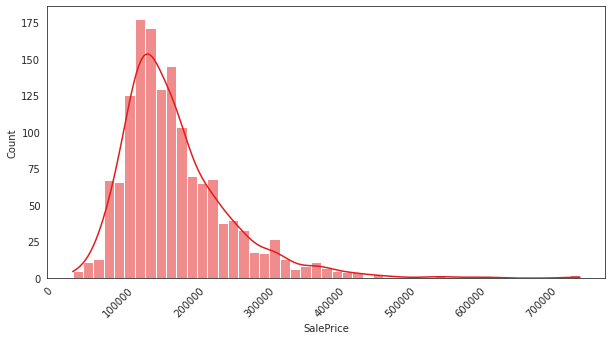

In [15]:
plt.figure(figsize = (10, 5))
sns.histplot(data=train_df, x='SalePrice', kde=True)
plt.xticks(rotation=45)

In [16]:
print('SalePrice Skewness: {}'.format(train_df['SalePrice'].skew()))
print('SalePrice Kurtosis: {}'.format(train_df['SalePrice'].kurt()))

SalePrice Skewness: 1.8828757597682129
SalePrice Kurtosis: 6.536281860064529


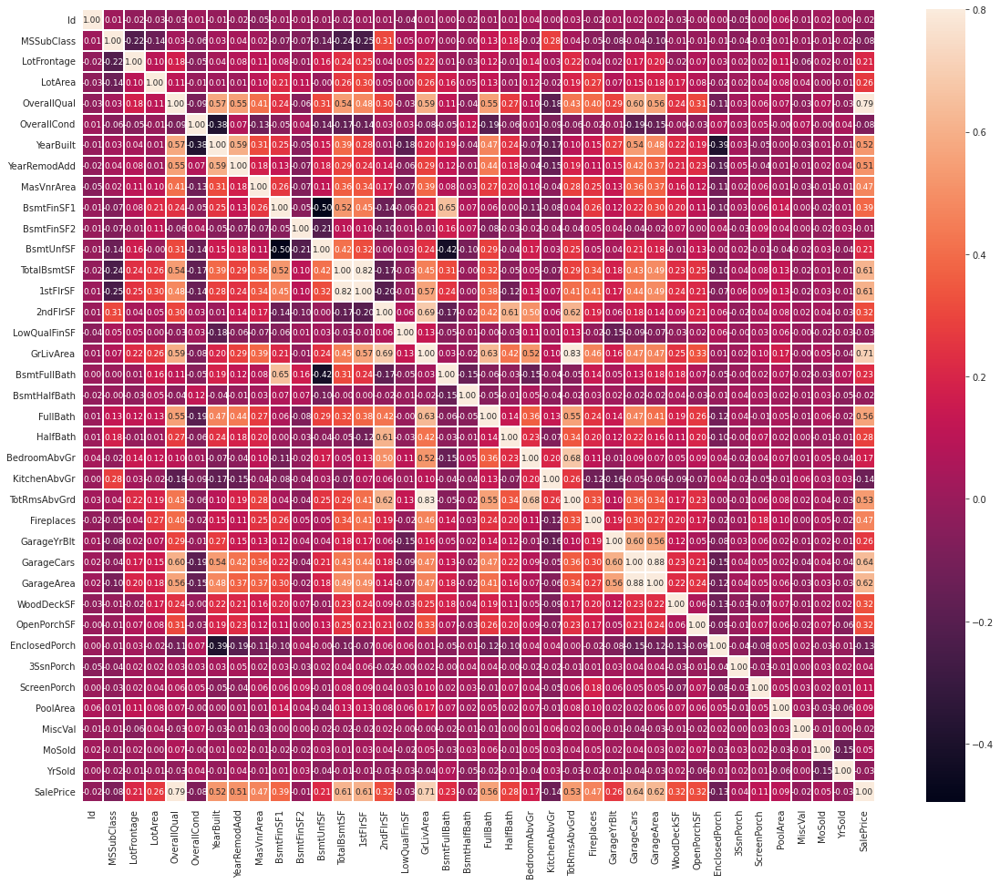

In [17]:
corrmat = train_df.corr()

plt.figure(figsize=(20, 16))
sns.heatmap(corrmat, square=True, linewidths=0.1, linecolor='white', vmax=0.8, annot=True, annot_kws={'size':9}, fmt='.2f');

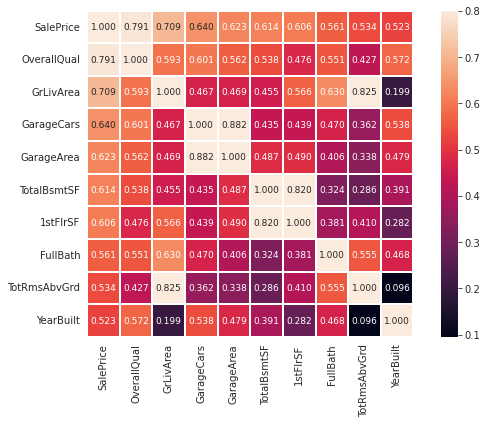

In [18]:
cols = corrmat.nlargest(10, 'SalePrice')['SalePrice'].index

plt.figure(figsize=(10, 6))
sns.heatmap(train_df[cols].corr(), square=True, linewidths=0.1, linecolor='white', vmax=0.8, annot=True, annot_kws={'size':9}, fmt='.3f');

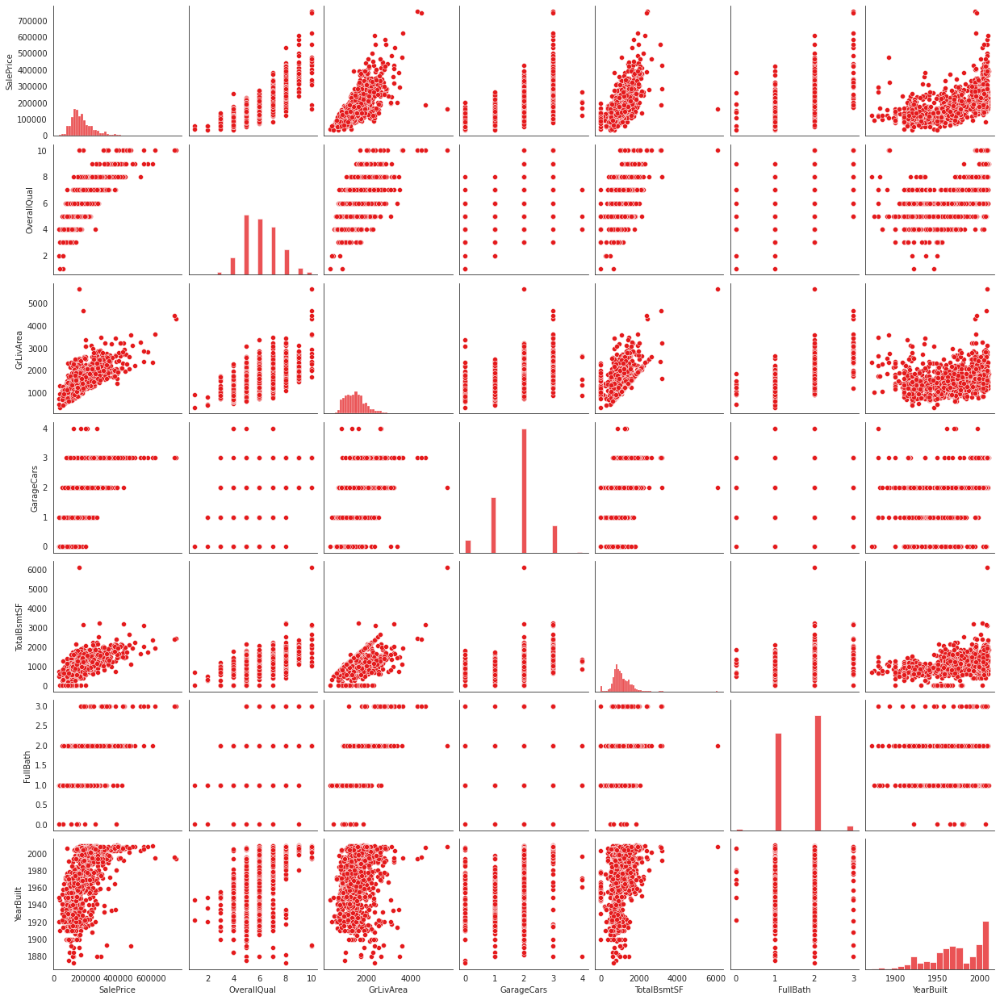

In [19]:
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(train_df[cols]);

In [20]:
def plot_num(data, x, y):
    plt.figure(figsize=(15, 8))
    sns.regplot(data=data, x=x, y=y, marker='*', robust=True)
    plt.xticks(rotation=45)
    plt.show()

def plot_cat(data, x, y):
    plt.figure(figsize=(20, 8))
    sns.boxplot(data=data, x=x, y=y)
    plt.xticks(rotation=90)
    plt.show()

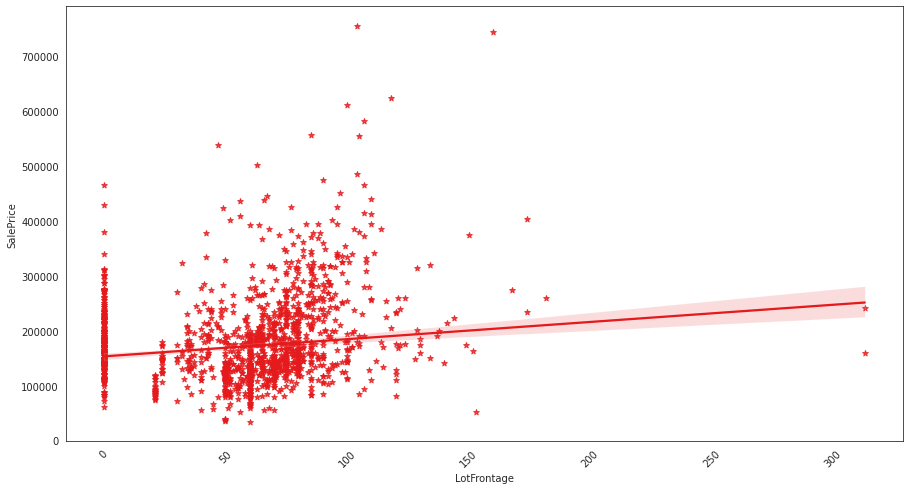

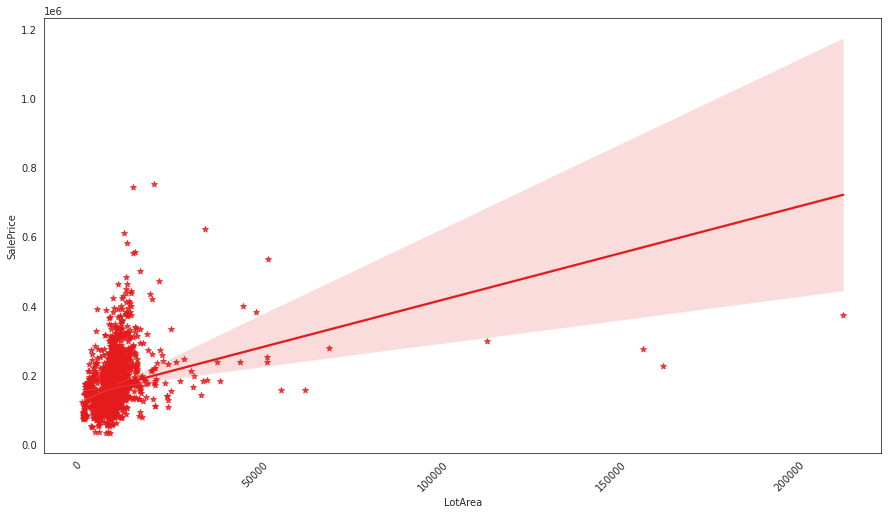

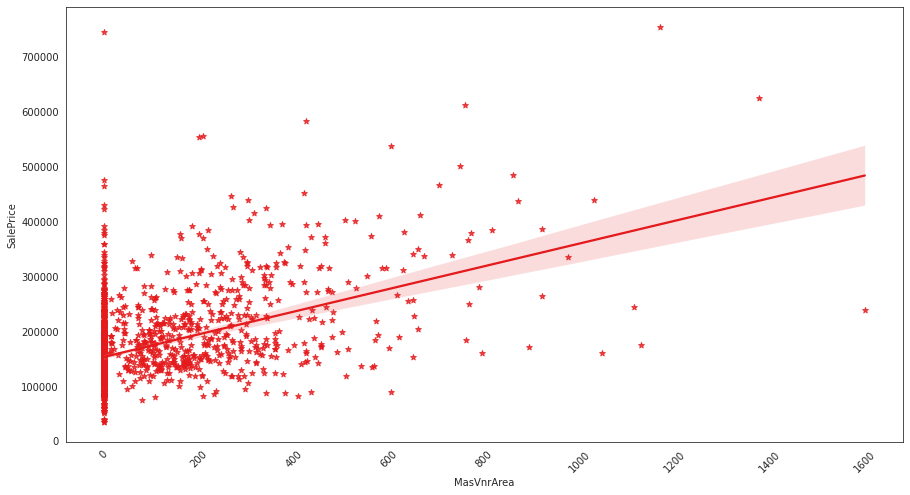

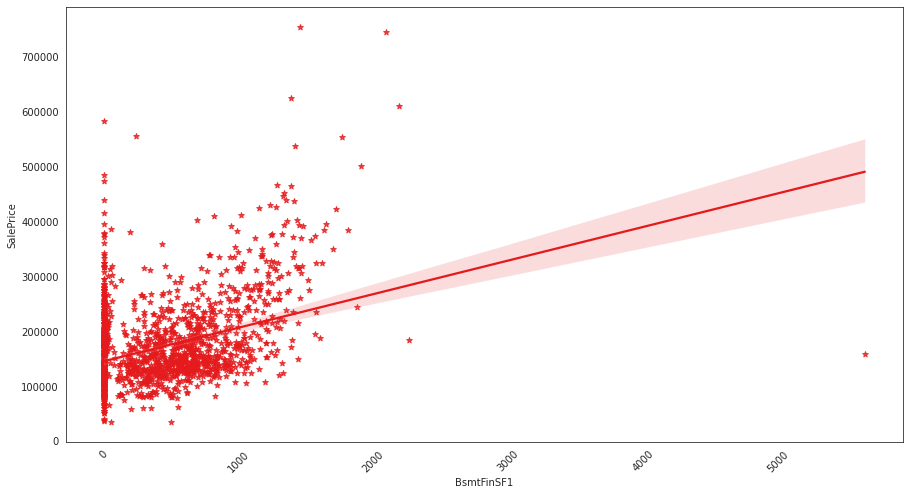

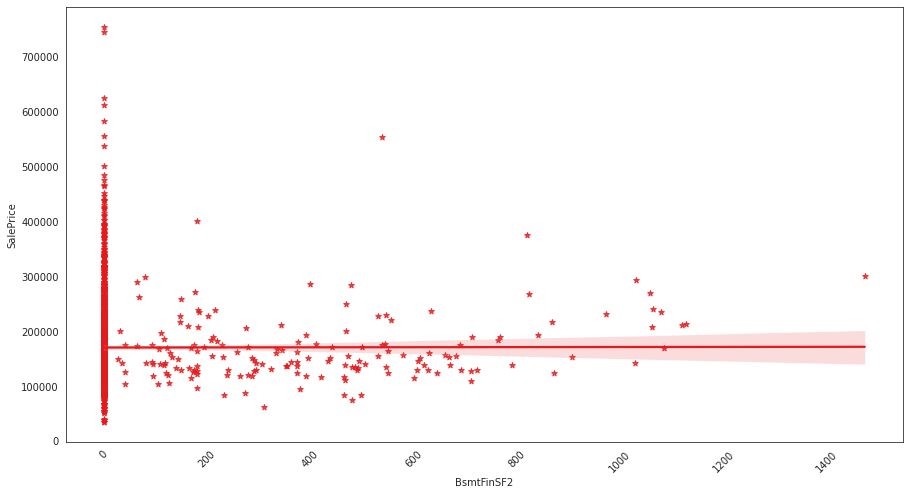

...

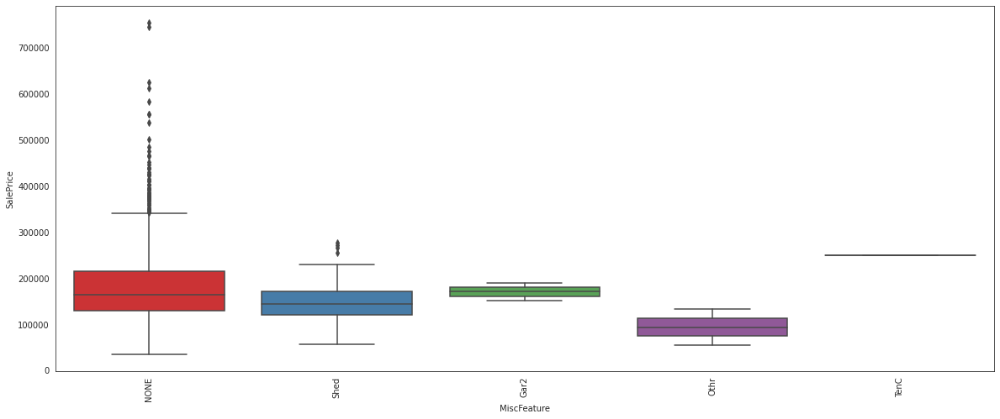

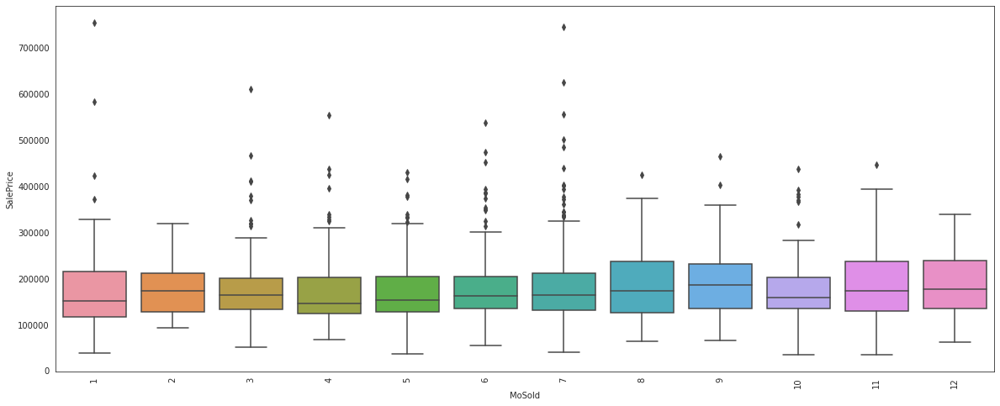

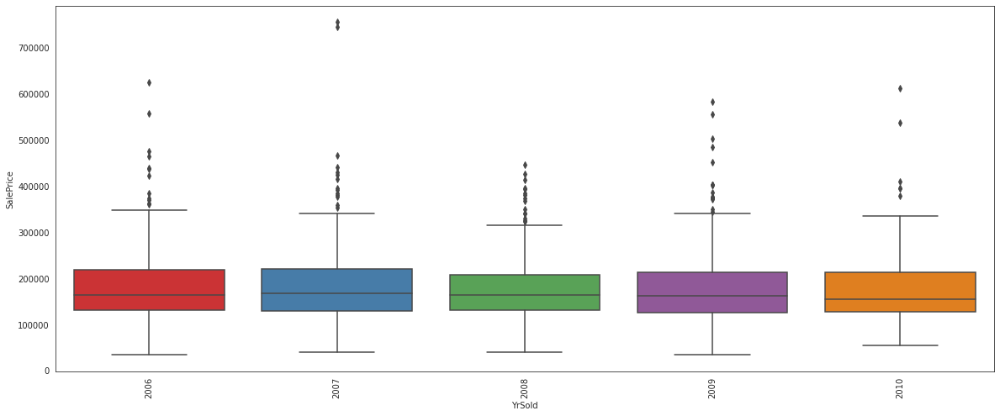

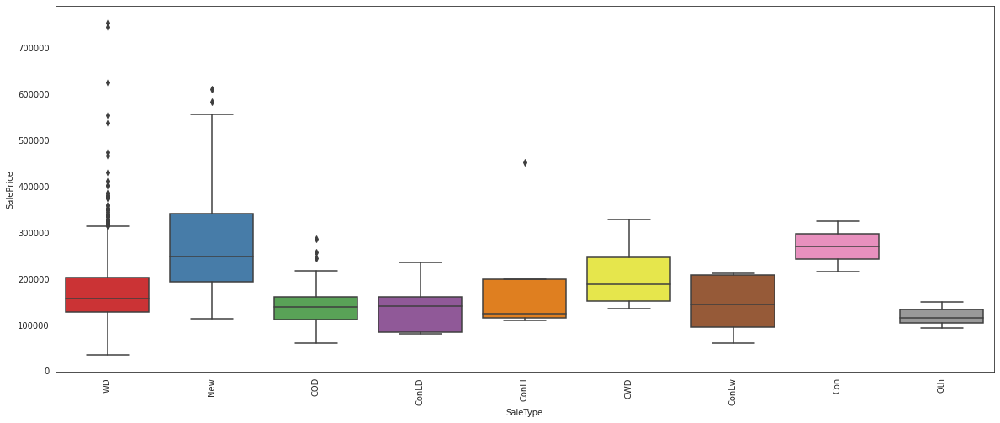

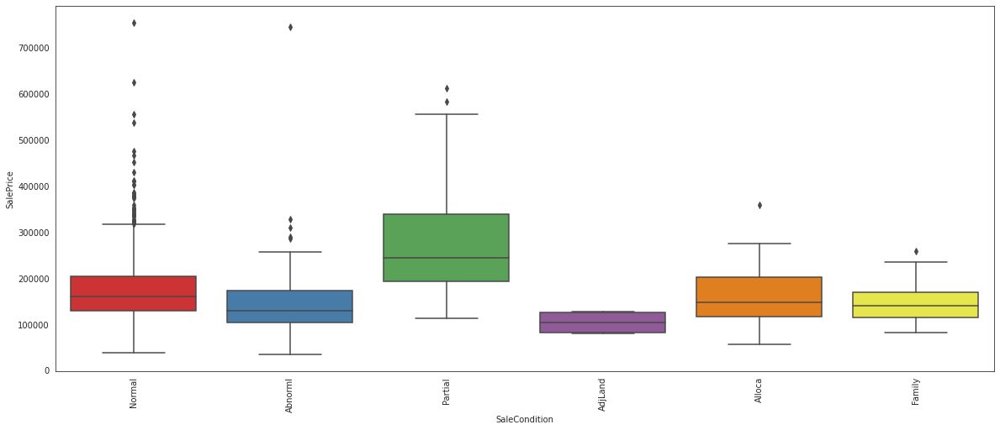

In [21]:
for num in num_cols:
    plot_num(train_df, num, 'SalePrice')

for cat in cat_cols:
    plot_cat(train_df, cat, 'SalePrice')

# Data Cleaning

## Converting to Ordinal and Categorical

In [22]:
train_df.drop('Id', axis=1, inplace=True)

In [23]:
# ToDo: Doesn't Work :(
train_df_dummies = train_df
test_df_dummies = test_df

for df in [train_df_dummies, test_df_dummies]:
    for col in ['MSZoning', 'Street', 'Alley', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
                'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'GarageType', 'MiscFeature', 'SaleType', 'SaleCondition',
                'MoSold', 'MSSubClass', 'LandContour', 'Electrical']:
        df = pd.concat([df, pd.get_dummies(df[col], prefix=col, drop_first=True)], axis=1)
        df.drop(col, axis=1, inplace=True)

print(train_df_dummies.shape, test_df_dummies.shape)
        
# In order to have same columns on both train and test sets, we do the following.
# test_df_dummies.reindex(columns=train_df_dummies.columns, fill_value=0)

(1460, 80) (1459, 80)


In [24]:
# for col in train_df_dummies.columns:
#     if col not in cat_cols:
#         print(col)

pd.concat([train_df_dummies, pd.get_dummies(train_df_dummies['Heating'], prefix='Heating', drop_first=True)], axis=1)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall
0,60,RL,65.0,8450,Pave,NONE,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NONE,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NONE,NONE,NONE,0,2,2008,WD,Normal,208500,1,0,0,0,0
1,20,RL,80.0,9600,Pave,NONE,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NONE,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NONE,NONE,NONE,0,5,2007,WD,Normal,181500,1,0,0,0,0
2,60,RL,68.0,11250,Pave,NONE,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NONE,NONE,NONE,0,9,2008,WD,Normal,223500,1,0,0,0,0
3,70,RL,60.0,9550,Pave,NONE,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NONE,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NONE,NONE,NONE,0,2,2006,WD,Abnorml,140000,1,0,0,0,0
4,60,RL,84.0,14260,Pave,NONE,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NONE,NONE,NONE,0,12,2008,WD,Normal,250000,1,0,0,0,0
5,50,RL,85.0,14115,Pave,NONE,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NONE,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NONE,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NONE,MnPrv,Shed,700,10,2009,WD,Normal,143000,1,0,0,0,0
6,20,RL,75.0,10084,Pave,NONE,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NONE,NONE,NONE,0,8,2007,WD,Normal,307000,1,0,0,0,0
7,60,RL,0.0,10382,Pave,NONE,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NONE,NONE,Shed,350,11,2009,WD,Normal,200000,1,0,0,0,0
8,50,RM,51.0,6120,Pave,NONE,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NONE,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NONE,NONE,NONE,0,4,2008,WD,Abnorml,129900,1,0,0,0,0
9,190,RL,50.0,7420,Pave,

In [25]:
for df in [train_df_dummies, test_df_dummies]:
    df = df.replace({'LotShape': {'IR3': 1, 'IR2': 2, 'IR1': 3, 'Reg': 4},
                     'LandSlope': {'Gtl': 1, 'Mod': 2, 'Sev': 3},
                     'ExterQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'ExterCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'BsmtQual': {'NONE': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'BsmtCond': {'NONE': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'GarageQual': {'NONE': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'GarageCond': {'NONE': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'PoolQC': {'NONE': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4},
                     'FireplaceQu': {'NONE': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'HeatingQC': {'NONE': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'KitchenQual': {'NONE': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
                     'GarageFinish': {'NONE': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3},
                     'BsmtFinType1': {'NONE': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
                     'BsmtFinType2': {'NONE': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
                     'BsmtExposure': {'NONE': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4},
                     'Functional': {'Sal': 0, 'Sev': 1, 'Maj2': 2, 'Maj1': 3, 'Mod': 4, 'Min2': 5, 'Min1': 6, 'Typ': 7},
                     'PavedDrive': {'N': 0, 'P': 1, 'Y': 2},
                     'Fence': {'NONE': 0, 'MnWw': 1, 'GdWo': 2, 'MnPrv': 3, 'GdPrv': 4},
                     'Utilities': {'ELO': 0, 'NoSeWa': 1, 'NoSewr': 2, 'AllPub': 3}})


In [26]:
train_df_dummies.value_counts

<bound method DataFrame.value_counts of       MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0             60       RL         65.0     8450   Pave  NONE      Reg   
1             20       RL         80.0     9600   Pave  NONE      Reg   
2             60       RL         68.0    11250   Pave  NONE      IR1   
3             70       RL         60.0     9550   Pave  NONE      IR1   
4             60       RL         84.0    14260   Pave  NONE      IR1   
5             50       RL         85.0    14115   Pave  NONE      IR1   
6             20       RL         75.0    10084   Pave  NONE      Reg   
7             60       RL          0.0    10382   Pave  NONE      IR1   
8             50       RM         51.0     6120   Pave  NONE      Reg   
9            190       RL         50.0     7420   Pave  NONE      Reg   
10            20       RL         70.0    11200   Pave  NONE      Reg   
11            60       RL         85.0    11924   Pave  NONE      IR1   
12         

In [27]:
# ToDo: Year columns not done.

for col in cat_cols:
    if col not in ['BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'OverallQual',
                   'OverallCond', 'LotShape', 'LandSlope', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond', 'PoolQC', 'FireplaceQu',
                   'HeatingQC', 'KitchenQual', 'GarageFinish', 'BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'Functional', 'PavedDrive', 'Fence', 'Utilities',
                   'MSZoning', 'Street', 'Alley', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
                   'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'GarageType', 'MiscFeature',
                   'SaleType', 'SaleCondition', 'MoSold', 'MSSubClass', 'LandContour', 'Electrical']:
        print(train_df[col].value_counts())

2006    67
2005    64
2004    54
2007    49
2003    45
1976    33
1977    32
1920    30
1959    26
1998    25
1999    25
1965    24
2000    24
1970    24
1954    24
1958    24
2008    23
2002    23
1972    23
1971    22
1968    22
1950    20
1957    20
2001    20
1994    19
1962    19
1940    18
1966    18
2009    18
1995    18
1910    17
1993    17
1960    17
1963    16
1978    16
1925    16
1955    16
1967    16
1996    15
1941    15
1964    15
1961    14
1948    14
1956    14
1969    14
1997    14
1992    13
1953    12
1990    12
1949    12
1973    11
1988    11
1900    10
1974    10
1915    10
1980    10
1984     9
1926     9
1936     9
1979     9
1930     9
1922     8
1975     8
1939     8
1916     8
1928     7
1914     7
1923     7
1924     7
1918     7
1946     7
1935     6
1951     6
1921     6
1945     6
1982     6
1931     6
1986     5
1937     5
1981     5
1991     5
1947     5
1952     5
1985     5
1929     4
1938     4
1983     4
1932     4
1880     4
1919     3
1989     3

## Dropping Redundant Columns

In [28]:
# From the above heatmaps, we can conclude that 'GarageArea', 'TotRmsAbvGrd', '1stFlrSF', and 'GarageYrBlt' are causing multicollinearity; so we'll drop them.

for df in [train_df, test_df]:
    df.drop(['GarageArea', 'TotRmsAbvGrd', '1stFlrSF', 'GarageYrBlt'], axis=1, inplace=True)

## Normalizing Columns

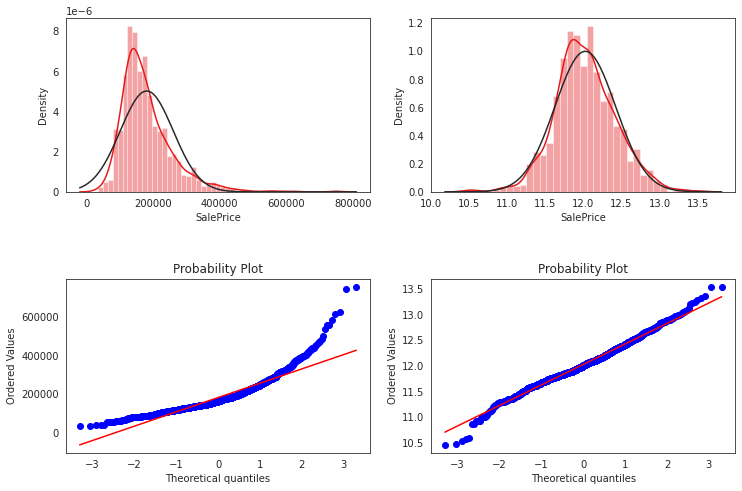

In [29]:
# Positive skewness --> do log transformation to normalize the distribution

fig, axis = plt.subplots(2, 2, figsize=(12,8))

sns.distplot(train_df['SalePrice'], kde=True, fit=stats.norm, ax=axis[0,0]);
stats.probplot(train_df['SalePrice'], plot=axis[1,0]);

sns.distplot(np.log(train_df['SalePrice']), kde=True, fit=stats.norm, ax=axis[0,1]);
stats.probplot(np.log(train_df['SalePrice']), plot=axis[1,1]);

fig.subplots_adjust(hspace=0.5)

train_df['SalePrice'] = np.log(train_df['SalePrice'])

# Do not forget to do the exp transform 'SalePrice' for prediction

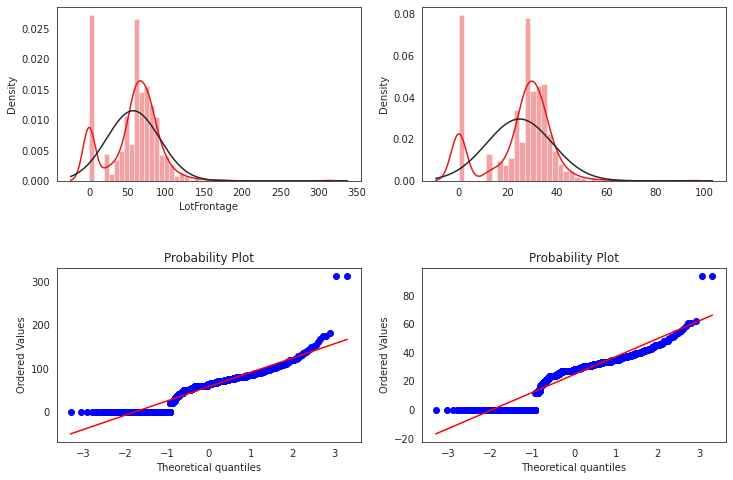

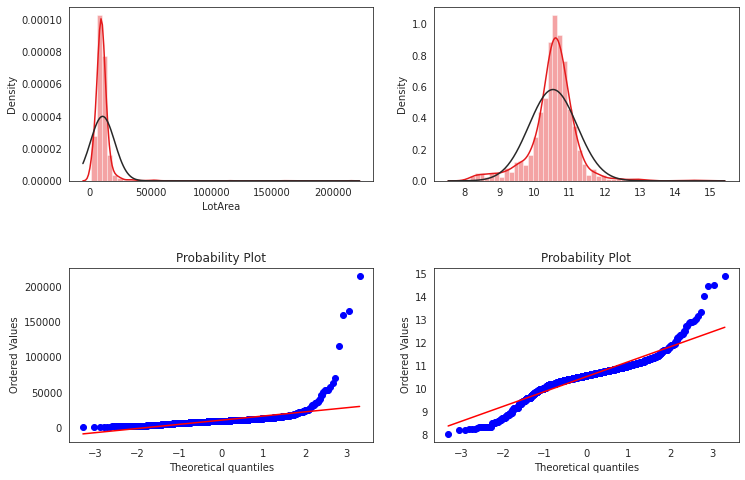

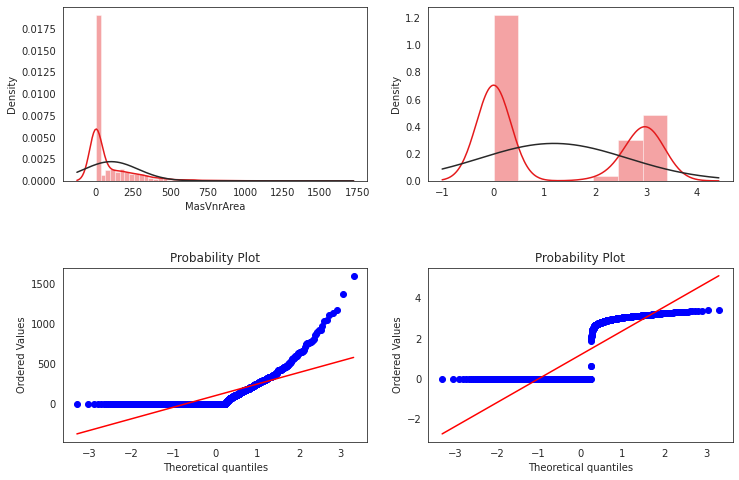

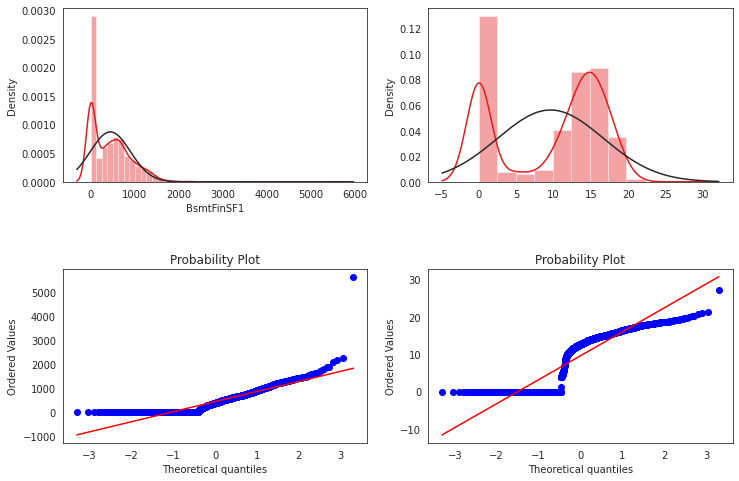

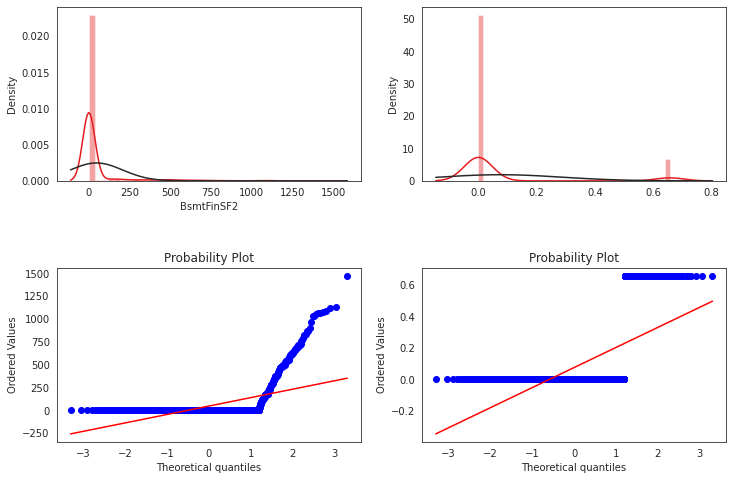

...

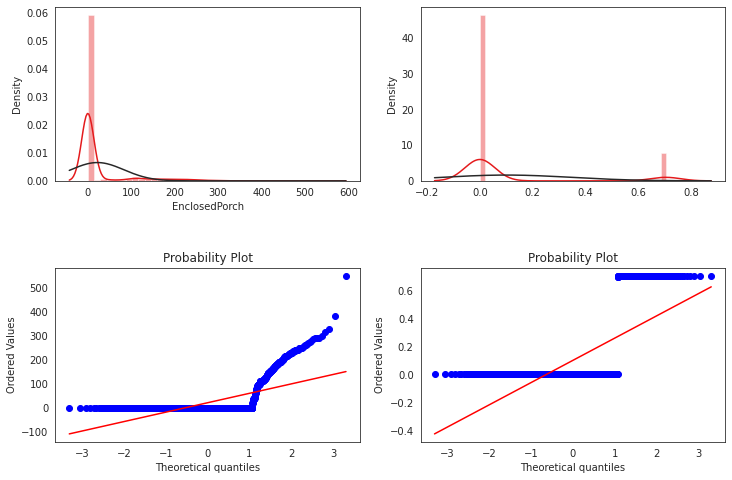

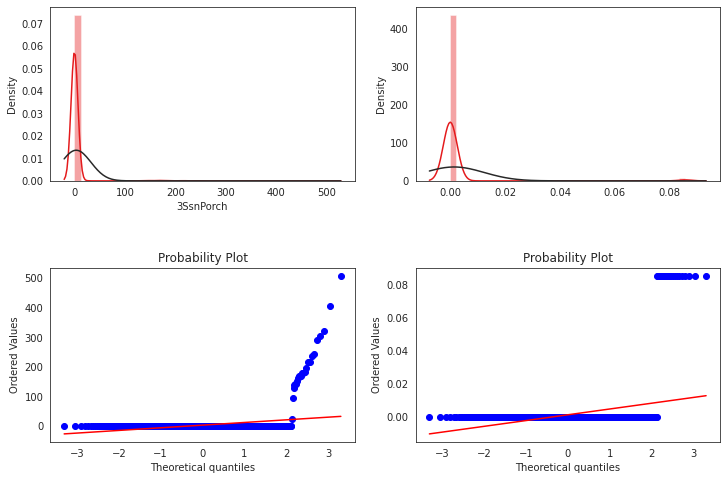

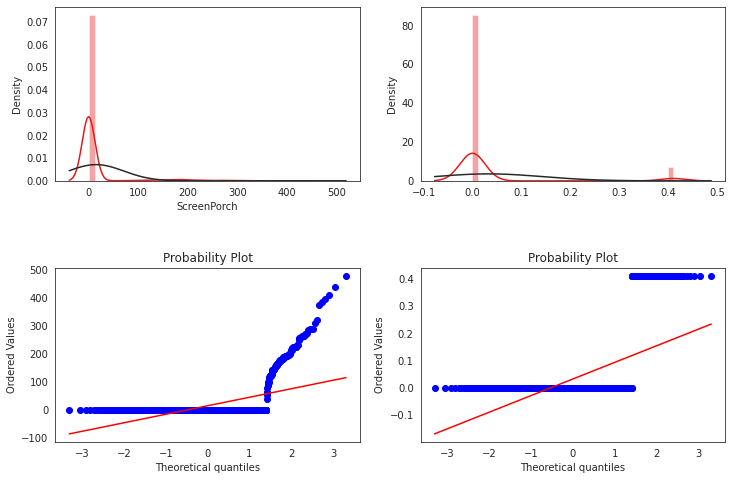

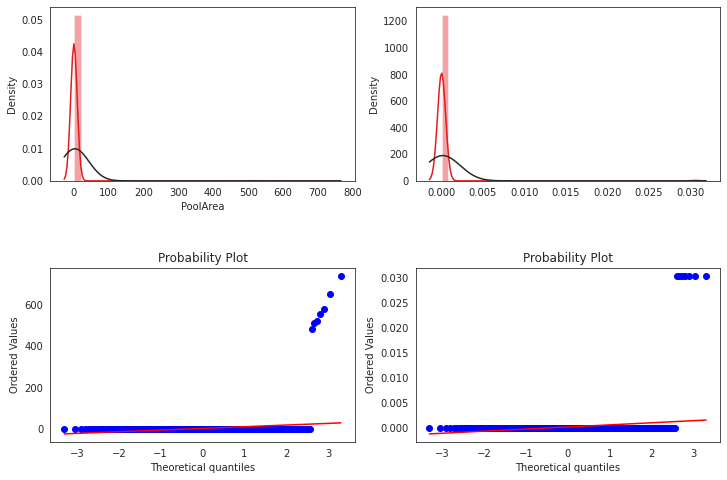

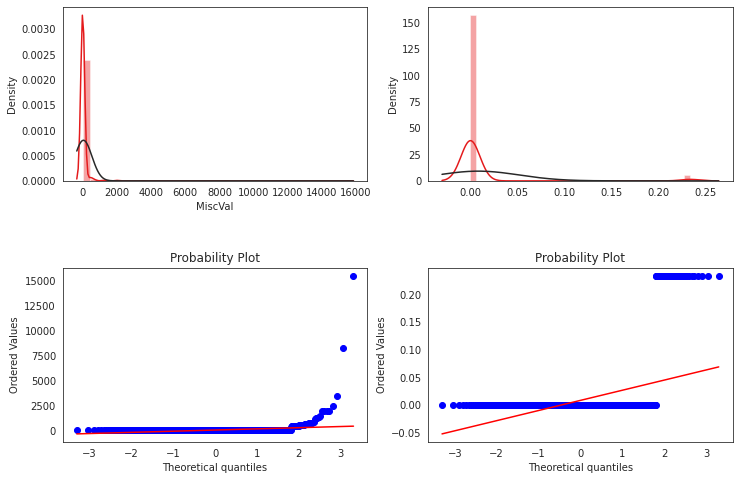

In [30]:
# We use 'yeojohnson' normalizer, due to the zero values in independent columns.
for num in num_cols:
    if num in train_df.columns:
        fig, axis = plt.subplots(2, 2, figsize=(12,8))

        sns.distplot(train_df[num], kde=True, fit=stats.norm, ax=axis[0,0]);
        stats.probplot(train_df[num], plot=axis[1,0]);

        sns.distplot(stats.yeojohnson(train_df[num])[0], kde=True, fit=stats.norm, ax=axis[0,1]);
        stats.probplot(stats.yeojohnson(train_df[num])[0], plot=axis[1,1]);

        fig.subplots_adjust(hspace=0.5)
    else:
        continue

In [31]:
# Let's only normalize 'LotArea', 'BsmtUnfSF', 'TotalBsmtSF', 'GrLivArea'.

for col in ['LotArea', 'BsmtUnfSF', 'TotalBsmtSF', 'GrLivArea']:
    train_df[col], _ = stats.yeojohnson(train_df[col])